## Social Data Analysis & Visualization - Assignment 1 Group 49 - Spring 2024

### A1 Part 1: Visualizing patterns in the data<br>


#### Brief Intro About the Dataset

<br>
We start by importing necessary libraries for Part 1 of the assignment

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime

For this assignment 'Police Department Incident Reports: Historical 2003 to May 2018 dataset' is used. Source of the dataset is given below: 
<br>
https://data.sfgov.org/Public-Safety/Police-Department-Incident-Reports-Historical-2003/tmnf-yvry/about_data

We make pandas import and read our dataset and we named it as 'df'. Basically, the dataset contains information about crime incidents happened inside San Francisco. It stores crime types in 'Category' column, districts of San Francisco where the crime incident happened in 'PdDistrict' column and date when the crime happened in 'Date' column. This dataset stores crime incidents happened in San Francisco from Jan,2003 to May, 2018. Further details are shown about the attributes and dataset is shown with the following codes.

In [2]:
file_path = r'C:\Users\45502\Desktop\Social Data\assignment 1\Police_Department_Incident_Reports__Historical_2003_to_May_2018_20240226.csv'
df = pd.read_csv(file_path)
df.head(5) # Visualizes the first 5 rows of our dataframe

,PdId,IncidntNum,Incident Code,Category,Descript,DayOfWeek,Date,Time,PdDistrict,Resolution,...,Fix It Zones as of 2017-11-06 2 2,DELETE - HSOC Zones 2 2,Fix It Zones as of 2018-02-07 2 2,"CBD, BID and GBD Boundaries as of 2017 2 2","Areas of Vulnerability, 2016 2 2",Central Market/Tenderloin Boundary 2 2,Central Market/Tenderloin Boundary Polygon - Updated 2 2,HSOC Zones as of 2018-06-05 2 2,OWED Public Spaces 2 2,Neighborhoods 2
0,4133422003074,41334220,3074,ROBBERY,"ROBBERY, BODILY FORCE",Monday,11/22/2004,17:50,INGLESIDE,NONE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,5118535807021,51185358,7021,VEHICLE THEFT,STOLEN AUTOMOBILE,Tuesday,10/18/2005,20:00,PARK,NONE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,4018830907021,40188309,7021,VEHICLE THEFT,STOLEN AUTOMOBILE,Sunday,02/15/2004,02:00,SOUTHERN,NONE,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,11014543126030,110145431,26030,ARSON,ARSON,Friday,02/18/2011,05:27,INGLESIDE,NONE,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,94.0
4,10108108004134,101081080,4134,ASSAULT,BATTERY,Sunday,11/21/2010,17:00,SOUTHERN,NONE,...,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,32.0


As it can be seen here we have 80921950 observations and 37 attributes in this dataset. But we are only interested to 'PdDistrict', 'Date' , 'Category' attributes.

In [3]:
df.size

74533375

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2129525 entries, 0 to 2129524
Data columns (total 35 columns):
 #   Column                                                    Dtype  
---  ------                                                    -----  
 0   PdId                                                      int64  
 1   IncidntNum                                                int64  
 2   Incident Code                                             int64  
 3   Category                                                  object 
 4   Descript                                                  object 
 5   DayOfWeek                                                 object 
 6   Date                                                      object 
 7   Time                                                      object 
 8   PdDistrict                                                object 
 9   Resolution                                                object 
 10  Address                       

For this assignment, we are focusing on certain crime types such as below.

In [5]:
focuscrimes = set(['WEAPON LAWS', 'PROSTITUTION', 'DRIVING UNDER THE INFLUENCE', 'ROBBERY', 'BURGLARY', 'ASSAULT',
                   'DRUNKENNESS', 'DRUG/NARCOTIC', 'TRESPASS', 'LARCENY/THEFT', 'VANDALISM', 'VEHICLE THEFT',
                   'STOLEN PROPERTY', 'DISORDERLY CONDUCT'])

#### Data Preprocessing

<br>

In this part we applied some basic data preprocessing such as parsing the date data and some formatting to further use.

In [6]:
df['Date'] = pd.to_datetime(df['Date'], format='%m/%d/%Y')
df['DayOfWeek'] = df['Date'].dt.day_name()
df['Month'] = df['Date'].dt.month_name()
df['Hour'] = pd.to_datetime(df['Time'], format='%H:%M').dt.hour
df['WeekHour'] = df['Date'].dt.dayofweek * 24 + df['Hour']
days_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
hour_labels = [f"{day} {hour:02d}:00" for day in days_of_week for hour in range(24)]
months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

To plot the barcharts to do the necessary visualizations, we define a function to be called later in the next steps to set the formatting.

In [7]:
def plot_crime_data(focuscrimes, df, title, xlabel, ylabel, column, subplot_layout, tick_labels=None, fig_size=(20, 30), title_font_size=20, xlabel_font_size=12, ylabel_font_size=10, plot_title_font_size=15):
    plt.figure(figsize=fig_size)
    plt.suptitle(title, fontsize=title_font_size)
    for i, crime in enumerate(focuscrimes, start=1):
        plt.subplot(subplot_layout[0], subplot_layout[1], i)
        if column == 'DayOfWeek':
            crime_data = df[df['Category'] == crime][column].value_counts().reindex(days_of_week)
        elif column == 'Month':
            crime_data = df[df['Category'] == crime][column].value_counts().reindex(months_order)
        else:
            crime_data = df[df['Category'] == crime][column].value_counts().sort_index()
        crime_data.plot(kind='bar', color='skyblue', edgecolor='black')
        plt.title(crime, fontsize=plot_title_font_size)
        plt.xlabel(xlabel, fontsize=xlabel_font_size)
        plt.ylabel(ylabel, fontsize=ylabel_font_size)
        if tick_labels is not None and column == 'WeekHour':
            plt.xticks(ticks=np.arange(len(tick_labels)), labels=tick_labels, rotation=90)
        else:
            plt.xticks(rotation=45)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()
    

In here we define a new dataset for only investigating the crime types we want to focus on.

In [8]:
filtered_df = df[df['Category'].isin(focuscrimes)]

#### Data Visualizations

<br>

**The barcharts for the focused crime types are plotted for the question below:**
<br>
*First create the week-day plots, the months, the 24-hour cycle, and the 168 hours of the week as barcharts (Week 2, Part 2).*

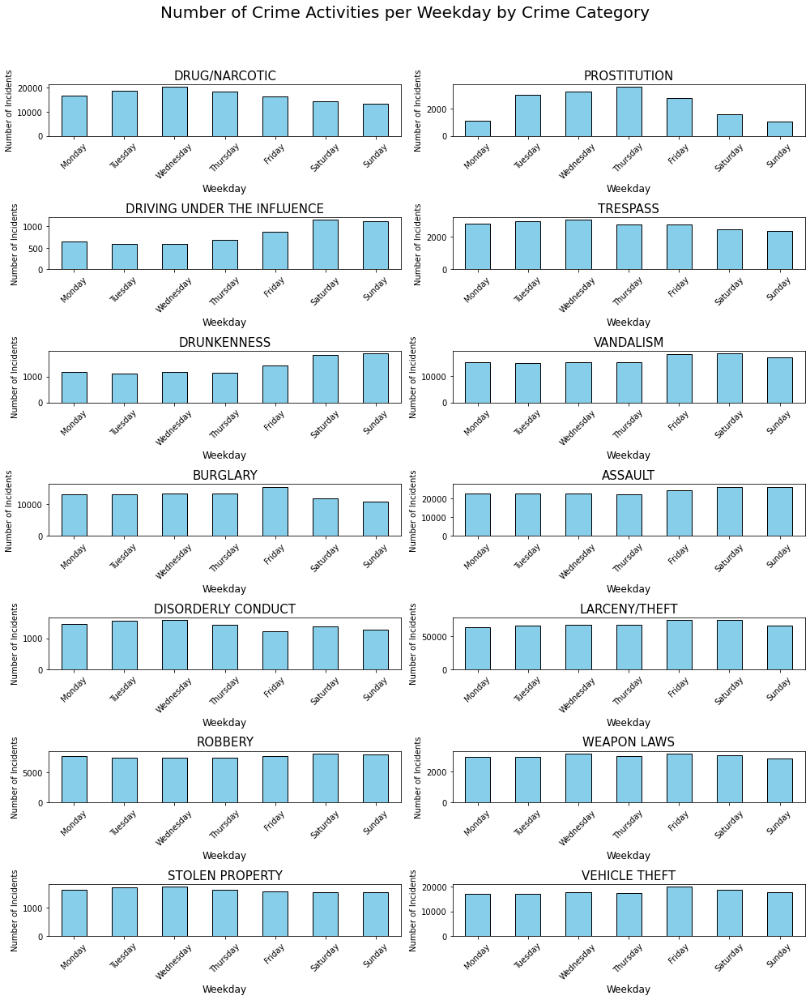

In [9]:
plot_crime_data(focuscrimes, filtered_df, 'Number of Crime Activities per Weekday by Crime Category',
                'Weekday', 'Number of Incidents', 'DayOfWeek', (7, 2), fig_size=(14, 18))

**Figure 1:** Number of crime activities per weekday by focused crime categories are plotted in this Figure. X-axis of the figures represent days of a week and Y-axis shows the number of incidents happened at that day of the week.

<br>

It can be seen from the plots that; crime incidents such as Driving Under the Influence and Drunkenness have higher number on weekends, when it is more likely to partake in social gatherings, celebrations and parties potentially leading to higher alcohol or/and drug consumption and impaired driving attempts. Also individuals might be more likely to consume alcohol or/and drugs during weekends due to relaxed work schedules and increased leisure time. 

<br>

But these are just potential explanations, and further research is needed to determine the exact causes.

<br> 

Strangely, for some reason plots show that prostituion and drug/narcotic crime incidents are higher during the weekdays compare to weekends. We will make a further explanation about that in Part 4 of this assignment when we explain about data errors, human errors, human noise etc. Let's just say that not everything may be explained by the first thing that comes to mind, as it appears in the data.

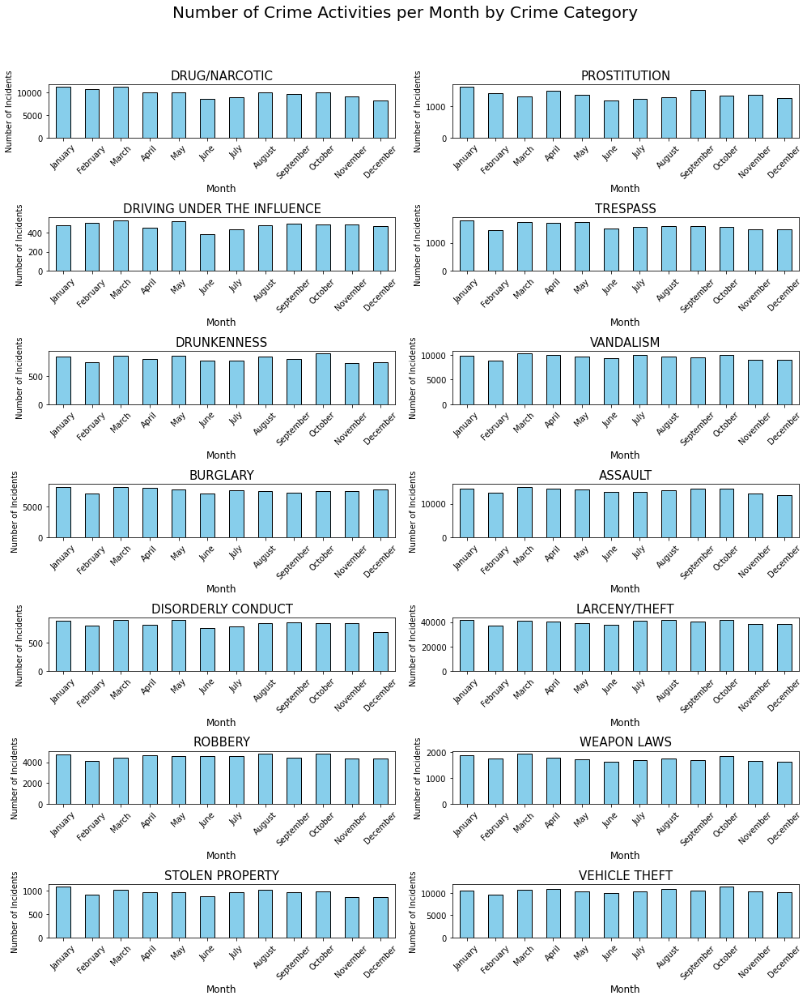

In [10]:
plot_crime_data(focuscrimes, filtered_df, 'Number of Crime Activities per Month by Crime Category',
                'Month', 'Number of Incidents', 'Month', (7, 2), fig_size=(14, 18))


**Figure 2:** Number of crime activities per month by crime category are plotted in this Figure. X-axis of the figures demonstrates the months of a year and Y-axis shows the number of incidents happened at that month of the year.

<br>

First thing can be seen from the plots is that; we have remarkable seasonal variations for crime type which are connected with leisure activities such as Drunkenness and Driving Under the Influence incidents. In rainy seasons, people tend to do more indoor social activities where alcohol is consumed. Also effect of celebrations for St.Patrick's Day in March might have a relationship with the increase of alcohol consumption based crimes. In contrast, the summer might offer more daylight hours and better weather, leading to a wider variety of recreational activities that might not involve drinking. Also the decrease of incidents may be caused by people leaving the city for vacation or maybe this is also the case of data error and human noise. Therefore further research is needed to find out the real reasons.

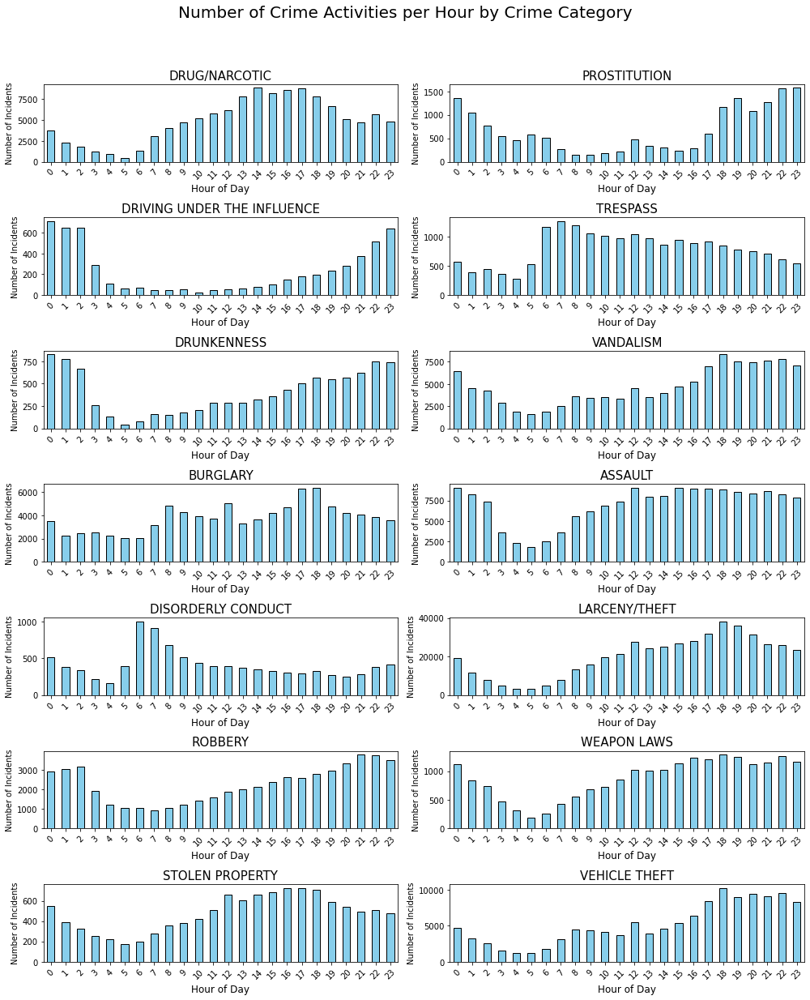

In [11]:
plot_crime_data(focuscrimes, filtered_df, 'Number of Crime Activities per Hour by Crime Category',
                'Hour of Day', 'Number of Incidents', 'Hour', (7, 2), fig_size=(14, 18))

**Figure 3:** Number of crime activities per day hour by crime category are plotted in this Figure. X-axis of the figures exhibits the hours of a day and Y-axis shows the number of incidents happened at that hour of the day.

<br>

In here it is observable that either most of the crime incidents tend to occur in late times of the day or maybe they are reported or recorder more likely in late times of a day. Maybe, therefore the incidents are lower at the hours when most of the people tend to be in their sleeps. Also for driving under influence crime type, latenight times aligns with typical nightlife hours when bars, clubs, and restaurants are active, and people are more likely to be drinking and Driving conditions are more difficult at night due to reduced visibility, and drivers may be more tired, which can compound the effects of alcohol or drugs which might explain the increased incidents in late hours. But to understand the real reasons, further research is needed.

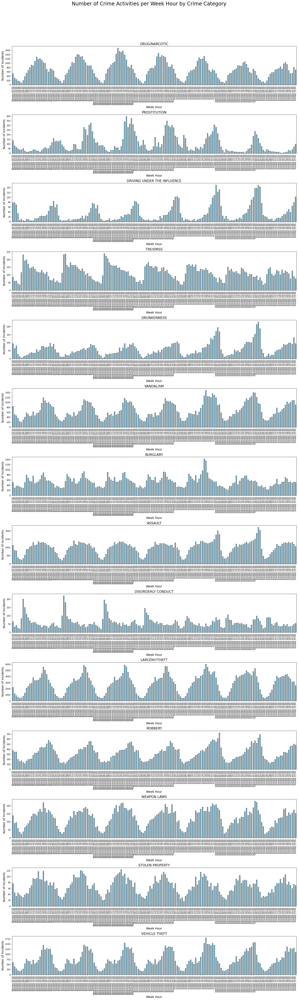

In [12]:
plot_crime_data(focuscrimes, filtered_df, 'Number of Crime Activities per Week Hour by Crime Category',
                'Week Hour', 'Number of Incidents', 'WeekHour', (14, 1), hour_labels, fig_size=(20, 70),
                title_font_size=24, xlabel_font_size=14, ylabel_font_size=14, plot_title_font_size=16)


**Figure 4:** Number of crime activities per week hour for each weekday by crime category are plotted in this Figure. X-axis of the figures exhibits the hours of the weekday and Y-axis shows the number of incidents happened at that hour of the day. This had to be a bit of a tight chart because we had to generate 168 bars.

<br>

The days and hours are traditionally associated with socializing and partying tend to have higher crime incidents due to higher likelihood of alcohol consumption and recreational drug use. This might explain the increase of incidents in that times for Drunkness related incidents but for Drug related crimes, the plots show that there is an increase during weekdays instead of weekends. One reason might be the time people get caught when they try to buy such items during the weekdays or narcotic police officers are more actively working in weekdays compare to weekends. Therefore to understand why the plots are like that, a deep investigation is required to avoid false reasoning. We should always consider there might be human bias, human error, data error or noise in the dataset.

**The calender plot for the focused crime type (Drunkenness) is plotted for the question below:**
<br>
*Next choose a crime type that you like and create a calendar plot (Week 2, Part 4). Don't forget to comment on patterns you observe.*
<br>

<br>
We selected Drunkenness as our focused crime type for plotting calender plot. Basically what we want to investigate is the frequency of drunkenness incidents occured for the days from January 2003 to May 2018. We start by importing necessary libraries.

In [13]:
import calendar
import numpy as np; np.random.seed(sum(map(ord, 'calplot')))
import calplot
from datetime import datetime, timedelta
from matplotlib.patches import Rectangle

Since every record in drunk_crimes indicates a day when the crime occurred, we create a Series with dates and a value of 1 (for crime occurred). We'll group by date and count occurrences, which should all be 1 since it's filtered for one crime type. Then, Now, every date in crime_series becomes a date when the crime occurred. Missing dates (where no crime occurred) will not be plotted, which is the desired behavior. We don't need to specify colors for days without crimes explicitly since they just won't be plotted.

C:\Users\45502\AppData\Local\Temp\ipykernel_12484\313596851.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  drunk_crimes['Date'] = pd.to_datetime(drunk_crimes['Date'])
findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


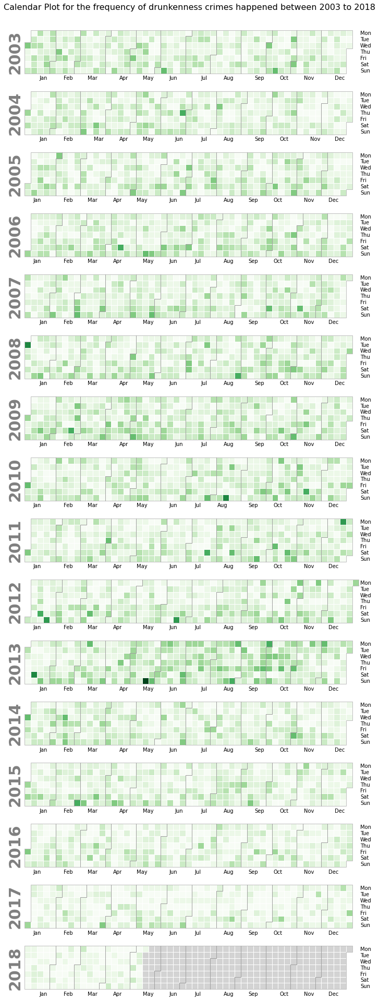

In [14]:
# selecting drunkenness and ensuring the date is parsed
drunk_crimes = df[df['Category'] == 'DRUNKENNESS']
drunk_crimes['Date'] = pd.to_datetime(drunk_crimes['Date'])

crime_series = drunk_crimes.groupby('Date').size()

# using calplot to plot our calender plot
calplot.calplot(crime_series, cmap='Greens', colorbar=False, fillcolor='lightgrey', linecolor='white', linewidth=0.5)

# Title of our plot
plt.suptitle('Calendar Plot for the frequency of drunkenness crimes happened between 2003 to 2018', fontsize=16)

# Layout adjustment to ensure the title does not overlap with the plot
plt.tight_layout(rect=[0, 0, 1, 0.98])

plt.show()

**Figure 5:** Calendar Plot for the frequency of drunkenness crimes happened between January 2003 to May 2018. Horizontal axis of the figure shows the months of the year and left vertical axis shows the year and right vertical axis represents the days of the week. Darker green the box gets means at that day higher drunkenness incidents happened with respect to lighter green boxes. The grey boxes represent data not available for that day. 

<br>

This calender plot helps us to have an overall approach from a bigger perspective about the crime incidents caused by drunkenness. It can be commented that in earlier 2000s there are more drunkenness incidents likely to happen but as the time goes and we see a decrease of drunkenness incidents occur in San Francisco. There might be a lot of reasons to see such a pattern, maybe Muslim population who avoid alcohol is increased in San Francisco or maybe people tend to be more aware about the harms of alcohol as the time goes or maybe the alcohol laws are loosened as the time goes so that there are less recorded crime incidents.

**The radial polar plot for the focused crime type (Prostitiution) is plotted for the question below:**
<br>
*Finally, choose a different crime type and create a polar plot of its 24hour cycle (Week 2, Part 4). Again, don't forget to comment as you would in a figure text.*
<br>

<br>
We selected Prostitution as our focused crime type this time for plotting the radial polar plot. Basically what we want to investigate is the frequency of prostitution incidents occured in 24 hour cycle of a day. We start by importing necessary libraries.

In [15]:
import plotly.express as px
import plotly.graph_objects as go

C:\Users\45502\anaconda3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [16]:
# Filtering our data for 'PROSTITUTION' crime type and converting Time from string to datetime format
prostitution_crimes = df[df['Category'] == 'PROSTITUTION']
prostitution_crimes['Time'] = pd.to_datetime(prostitution_crimes['Time'], format='%H:%M')
# We extract hour from 'Time' in here
prostitution_crimes['Hour'] = prostitution_crimes['Time'].dt.hour

# Group by hour and frequency
hourly_counts = prostitution_crimes.groupby('Hour').size().reset_index(name='Counts')

# We have to ensure the data covers all hours, even those with zero crimes
all_hours = pd.DataFrame({'Hour': range(24)})
hourly_counts = pd.merge(all_hours, hourly_counts, on='Hour', how='left').fillna(0)

C:\Users\45502\AppData\Local\Temp\ipykernel_12484\2018293317.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prostitution_crimes['Time'] = pd.to_datetime(prostitution_crimes['Time'], format='%H:%M')
C:\Users\45502\AppData\Local\Temp\ipykernel_12484\2018293317.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  prostitution_crimes['Hour'] = prostitution_crimes['Time'].dt.hour


In [17]:
# We start formatting and creating our radial polar plot in here
fig = go.Figure()

fig.add_trace(go.Barpolar(
    r=hourly_counts['Counts'],
    # To convert hour to degrees (24 hours -> 360 degrees)
    theta=hourly_counts['Hour'] * 15,  
    marker_color=[px.colors.sequential.Blues[i % len(px.colors.sequential.Blues)] for i in range(len(hourly_counts))],
    marker_line_color='black',
    marker_line_width=1,
    opacity=1
))

# Adding annotations for each bar to show the frequency count
for i, row in hourly_counts.iterrows():
    fig.add_annotation(
        # To convert hour to degrees (24 hours -> 360 degrees)
        x=row['Hour'] * 15,
        y=row['Counts'],
        # The frequency count
        text=str(row['Counts']),  
        font=dict(color='orange', size=14),
        showarrow=False,
        xanchor='center',  
        yanchor='bottom' 
    )

# Layout adjustments
fig.update_layout(
    title='24-Hour Cycle of Prostitution Crimes',
    polar=dict(
        radialaxis=dict(
            visible=True,
            range=[0, hourly_counts['Counts'].max() + 5]  
        ),
        angularaxis=dict(
            tickmode='array',
            tickvals=list(range(0, 360, 15)),
            # Labeling 24 hour time frame
            ticktext=[f"{h}:00" for h in range(24)]  
        )
    ),
    template="plotly_dark"  # style
)


fig.show()

**Figure 6:** The radial polar plot illustrates the 24-Hour Cycle of Prostitution Crimes. The blue bars represent the count of prostitution crime incident for the relevant hour of the day and the lateral white numbers are there for indicating the level of frequency.  

<br>

This radial polar plot demonstrates during late night hours it is more likely to prostitution crime incident happen as it can be expected from sexual habits of people which is more likely to happen in late night hours.

**Write a short reflection (max 400 words, shorter is OK) on how you've used LLMs to solve these assignments (or if you didn't use LLMs, explain why).**
<br>
<br>
In completing my assignments on data analysis and visualization, I occasionally turned to Language Learning Models for guidance, particularly when I encountered obstacles that halted my progress. While working through tasks such as creating calendar plots, I found myself at times unclear about the best approach or unsure how to interpret the data effectively.
<br>
<br>
During these moments, instead of seeking direct solutions, I used LLMs as a resource to provide a deeper understanding of the concepts I was grappling with. For instance, when I was stuck on interpreting patterns in the calendar plot, I didn't ask the LLM to generate the solution. Instead, I sought explanations on how to approach data pattern recognition, which helped me think more critically about the data I was analyzing.
<br>
<br>
The LLMs served as a form of interactive guide, offering insights and posing questions that encouraged me to reflect on my methods and the visualizations I was creating. This approach was in line with the courses guidelines of using these models not as a shortcut, but as an educational tool. The LLMs suggested resources and explained concepts in a way that was easy to understand, which was particularly helpful when I was dealing with complex Python libraries like "folium" and "plotly".
<br>
<br>
In summary, while I did utilize LLMs during my project, it was strictly as a supplementary aid for overcoming challenges and enhancing my understanding. This approach allowed me to maintain academic integrity while still benefiting from the advanced capabilities of LLMs to deepen my learning experience.

### A1 Part 2: Dataviz questions

**What is the difference between data and metadata? How does that relate to the GPS tracks-example?**

<br>
Data refers to the raw information or facts like numbers, text, or images. In a GPS tracks example, data is the actual route, including locations and times recorded during a journey. Metadata, on the other hand, is information about the data, like the type of device used, the time the data was collected, or the file format. In the GPS context, metadata could include the brand of the GPS device, the software version, or the date the track was recorded. So, while data shows "what" happened, metadata describes "how," "when," and "with what" it was recorded.
<br>

**Sune says that the human eye is a great tool for data analysis. Do you agree? Explain why/why not.Mention something that the human eye is very good at.Can you think of something that is difficult for the human eye to process visually. Explain why your example is difficult.**

<br>
The human eye is good for some types of data analysis because it can quickly spot patterns, colors, and changes, which helps in understanding information easily. However, the human eye struggles with very large datasets or very detailed data because it can't process huge amounts of information at once or see very small differences. For example, identifying specific trends in a complex spreadsheet with thousands of numbers can be difficult for the eye, as it's hard to compare and analyze all these details quickly and accurately.
<br>

**Simpson's paradox is hard to explain. Come up with your own example - or find one on line.**

<br>
Simpson's Paradox occurs when a trend appears in different groups of data but disappears or reverses when these groups are combined. Imagine two basketball players, A and B. In Season 1, A scores 30 points out of 50 attempts (60%) and B scores 20 out of 30 attempts (66.7%). In Season 2, A scores 70 out of 150 attempts (46.7%) and B scores 30 out of 70 attempts (42.9%).B seems to shoot better in both seasons. But when combining the data, A has a higher overall percentage (100 out of 200 or 50%) than B (50 out of 100 or 50%). This creates a phenomenon called Simpson's Paradox.
<br>

**In your own words, explain the difference between exploratory and explanatory data analysis.**


<br>
Imagine you're investigating a new place. Exploratory data analysis is like your first task, getting familiar with the overall layout and spotting interesting landmarks. You're simply observing and gathering information. Explanatory data analysis, on the other hand, is like turning detective. You use what you learned from exploratory data analysis to form hypotheses about why specific landmarks exist where they do, and test those ideas with more sophisticated tools. While exploratory data analysis helps you understand "what," explanatory analysis delves into "why."
<br>

### A1 Part 3: Visualizing geodata using Plotly

In this part we are creating a choropleth map of San Francisco by benefiting from plotly package, trying to find out where it's safest to leave your car on Sundays. We started by importing the necessary libraries.

In [18]:
import plotly.express as px
from urllib.request import urlopen
import json

In [19]:
# Importing San Francisco district shapefiles from the GeoJSON URL
with urlopen('https://raw.githubusercontent.com/suneman/socialdata2022/main/files/sfpd.geojson') as response:
    sf_districts = json.load(response)

In [20]:
# Preparation of the random data as a dataframe
randomdata = {
    'DISTRICT': ['CENTRAL', 'SOUTHERN', 'BAYVIEW', 'MISSION', 'PARK', 'RICHMOND', 'INGLESIDE', 'TARAVAL', 'NORTHERN', 'TENDERLOIN'],
    'VALUE': [0.283805288999638, 0.8882636532075772, 0.45059924801053985, 0.6000904430914474, 0.6362552416309091, 0.3371857964893169, 0.09876749056377487, 0.009436215026031758, 0.44884916837512767, 0.06616710190569974]
}
dfnew = pd.DataFrame(randomdata)

In [21]:
# In here we filter for 'VEHICLE THEFT' crime type that occurred on Sundays
vehicle_theft_sundays = df[(df['Category'] == 'VEHICLE THEFT') & (df['DayOfWeek'] == 'Sunday')]

# Data Aggregation by district's of SF
theft_counts_by_district = vehicle_theft_sundays['PdDistrict'].value_counts().reset_index()
theft_counts_by_district.columns = ['DISTRICT', 'THEFT_COUNTS']

# Loading the SF district shapefiles from the provided GeoJSON URL
with urlopen('https://raw.githubusercontent.com/suneman/socialdata2022/main/files/sfpd.geojson') as response:
    sf_districts = json.load(response)

# Generation of the choropleth map
fig = px.choropleth_mapbox(theft_counts_by_district, geojson=sf_districts, locations='DISTRICT', color='THEFT_COUNTS',
                           color_continuous_scale="OrRd",
                           range_color=(theft_counts_by_district['THEFT_COUNTS'].min(), theft_counts_by_district['THEFT_COUNTS'].max()),  # Set the range based on your data
                           mapbox_style="carto-positron",
                           zoom=11, center={"lat": 37.7749, "lon": -122.4194},
                           opacity=0.5,
                           labels={'THEFT_COUNTS':'Vehicle Theft Counts'}
                          )

# layout adjustments for better display
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0}, title="Vehicle Theft on Sundays in San Francisco by District")
fig.show()

**Figure 7:** The choropleth map illustrates the risk of vehicle theft crime occurance for each district of San Francisco. Darker the red color means higher risk of vehicle theft in that region and vice versa.

<br>

**Based on your map and analysis, where should you park the car for it to be safest on a Sunday? And where's the worst place?**

<br>

As it can be seen from this choropleth map district INGLESIDE has the darkest red colour, therefore INGLESIDE is the worst place to park your car on a Sunday while district TENDERLOIN is the safest place since it has the brightest red colour. You can hover on the districts to get information about the vehicle theft counts on Sundays.

**Using visualizatios can help us uncover powerful data-patterns. However, when designing visualizations, we need to be aware of several illusions that can lead viewers to misinterpret the data we are showing (i.e. perceptual errors): Try to change the range of data-values in the plot above. Is there a way to make the difference between district less evident? Why do you think perceptual errors are a problem? Try to think of a few examples.**

<br>
In the section below, we generated the same choropleth map but using a narrower range for the vehicle theft incident frequencies, so that each districts have a place at the upper end of this scale so they all become dark red and seem like they are all high risk areas which makes the map less evident.
<br>
Perceptual errors in data visualization can mislead and confuse the audience, leading to incorrect interpretations of data. For example, if a graph's scale is manipulated or not clearly labeled, it might exaggerate or minimize real trends, affecting decision-making. Another issue is unnecessary or overly complex elements distract from the actual data, making it hard for viewers to understand the key message. Additionally, using inappropriate chart types can lead to misunderstandings; for instance, pie charts can be confusing if there are too many segments, making it difficult to compare sizes accurately. These errors can result in people making poor decisions based on incorrect assumptions about the data. Therefore, it's crucial for visualizations to be clear, accurate, and appropriate for the data they represent to ensure that they effectively communicate the intended message without leading to perceptual misunderstandings.
<br>


In [22]:
# In here we filter for 'VEHICLE THEFT' crime type that occurred on Sundays
vehicle_theft_sundays = df[(df['Category'] == 'VEHICLE THEFT') & (df['DayOfWeek'] == 'Sunday')]

# Data Aggregation by district's of SF
theft_counts_by_district = vehicle_theft_sundays['PdDistrict'].value_counts().reset_index()
theft_counts_by_district.columns = ['DISTRICT', 'THEFT_COUNTS']

# Loading the SF district shapefiles from the provided GeoJSON URL
with urlopen('https://raw.githubusercontent.com/suneman/socialdata2022/main/files/sfpd.geojson') as response:
    sf_districts = json.load(response)

# Defining the maximum count for the narrowed range
max_theft_counts = theft_counts_by_district['THEFT_COUNTS'].max()
# This value 2 is used to change the range and make differences less evident
narrowed_max = max_theft_counts / 2  

# # Generation of the choropleth map with adjusted range
fig = px.choropleth_mapbox(theft_counts_by_district, geojson=sf_districts, locations='DISTRICT', color='THEFT_COUNTS',
                           color_continuous_scale="OrRd",  # You can change this scale for different colors
                           range_color=(0, narrowed_max),  # Setting a narrower range
                           mapbox_style="carto-positron",
                           zoom=11, center={"lat": 37.7749, "lon": -122.4194},
                           opacity=0.5,
                           labels={'THEFT_COUNTS':'Vehicle Theft Counts'}
                          )

# layout adjustments for better display
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0}, title="Vehicle Theft on Sundays in San Francisco by District")
fig.show()

**Figure 8:** The choropleth map with adjusted(narrowed) frequency of vehicle theft range illustrates the risk of vehicle theft crime occurance for each district of San Francisco. Darker the red color means higher risk of vehicle theft in that region and vice versa. Now every district looks like they are high risk areas for parking your car on Sundays which illustrates greatly how much perception can play a role in manipulating people's senses.

### A1 Part 4: Errors in the data

We started the course by plotting simple histogram and bar plots that showed a lot of cool patterns. But sometimes the binning can hide imprecision, irregularity, and simple errors in the data that could be misleading. In the work we've done so far, we've already come across at least three examples of this in the SF data (listed in Part 3 of Week 4).

The data errors we discovered at the end of Week 4 become hard (or impossible) to notice when we aggregate data (and when we calculate mean values, as well as statistics more generally). Thus, in a more general sense, we learn that when we visualize, data errors become difficult to identify when binning the data. We explore this process in the exercise below.


**In each of the 3 examples we listed during Week 4, describe in your own words how the data-errors I call attention to above can bias the binned versions of the data.**

<br>
For PROSTITUTION, the high number of events reported on Thursdays might not reflect real activity. This could be due to errors when people report crimes or if police are more active on these days. Sometimes, people might make mistakes or choose these days for reports by habit. If we only look at weekly totals, we might miss that this spike is unusual and not a true pattern. For timestamps of crimes, crimes reported exactly on the hour or at common times like 15 minutes past might not be precise. This happens because when remembering times, people tend to round to the nearest easy time. Or, police might fill in reports with estimated times. When we group these times together, it looks like crimes happen more often at these times than they really do.
For the place at the heatmap indicating high reports, the unexpected high reports of sex offenses at the Hall of Justice are likely wrong. It could be because this address is used as a default when the real place isn't known. This mistake makes it look like a dangerous place when it's not. When we look at areas with lots of reports without checking details, we might think this area is unsafe unfairly.
<br>

**Also, briefly mention how not noticing these errors can result in misconceptions about the underlying patterns of what's going on in San Francisco (and our modeling).**

<br>
Not seeing these errors can make us think crimes happen more on certain days, at certain times, or in certain places than they really do. This can make people scared for no reason and can make the police put their efforts in the wrong places. It's important to understand the real patterns so we can make the city safer.
<br>


**Did you find LLMs useful for anything in this exercise? Explain why/why not**


<br>
For this exercise, not really. Because as rookies of LLM users, we have only limited extent of knowledge about the capabilities of LLMs, so we can not find a way to make a use of them for this assignment. We don't know and not sure about the capabilites of LLMs for making assumptions like a human from plots and graphs and also their capabilities of overcoming phenomenons such as correlation over causation or understanding the possibility of data error, human noise, biases etc. According to us, as humans are still one step ahead about seeing what can not be easily seen.
<br>

In [23]:
import folium
import xyzservices.providers as xyz
from folium.plugins import HeatMap

In [24]:
map_sf = folium.Map(location=[37.773972 ,  -122.431297],
                    zoom_start = 13) 
map_sf

**Figure 9:** The geoplot of San Francisco map generated with the help of folium package is shown as above.

In [25]:
# Adding the Stadia Maps Stamen Toner provider details via xyzservices
tile_provider = xyz.Stadia.StamenToner

# Creating the folium TileLayer, with the API key
folium.TileLayer(
    tiles=tile_provider.build_url(api_key='6132b451-c391-4d34-a2db-3f04c0951c36'),
    attr=tile_provider.attribution,
    name=tile_provider.name,
    max_zoom=tile_provider.max_zoom,
    detect_retina=True
).add_to(map_sf)

# Adding a marker for "SF City Hall"
folium.Marker(
    location=[37.77919, -122.41914],
    popup='SF City Hall',  # This will be displayed when you click on the marker
    icon=folium.Icon(icon='cloud')  # This will put a cloud icon on the marker
).add_to(map_sf)

# Creating a dictionary mapping for district latitudes and longitudes found from google search
district_coordinates = {
    'INGLESIDE': [37.7229872, -122.4530272],
    'PARK': [37.769722, -122.476944],
    'SOUTHERN': [37.662937, -122.433014],
    'TARAVAL': [37.74261, -122.485361],
    'TENDERLOIN': [37.7833, -122.4167],
    'BAYVIEW': [37.730537, -122.372246],
    'CENTRAL': [37.773972, -122.431297],
    'NORTHERN': [37.809326, -122.409981],
    'MISSION': [37.7600, -122.4200],
    'RICHMOND': [37.935757, -122.347748]
}

# Filtering the data for 'PROSTITUTION' category
filtered_df = df[df['Category'] == 'PROSTITUTION']

# Adding a small dot for each district
for index, row in filtered_df.iterrows():
    if row['PdDistrict'] in district_coordinates:
        folium.CircleMarker(
            location=district_coordinates[row['PdDistrict']],  
            radius=5,  
            color='red',
            fill=True,
            fill_color='red'
        ).add_to(map_sf)

# Creates a list of coordinates for the heatmap
heatmap_data = [district_coordinates[district] for district in filtered_df['PdDistrict'] if district in district_coordinates]

# Creates the heatmap on our map 
HeatMap(heatmap_data).add_to(map_sf)

map_sf


**Figure 10:** The geoplot of San Francisco map generated with the help of folium package is shown as above this time using the format of Stadia Maps Stamen Toner provider details via xyzservices. San Francisco City Hall is tagged with a marker and level of prostitution related crimes is shown with heatmapping technique. Bigger the red circle means higher level of prostitution incidents reported for that district.

## Contributions

Ali Berk Gezgin - s220006 - Contributed in Part 1,2,3,4
<br>
Nael Rashdeen - s144841 - Contributed in Part 1,2,3,4